Importing Libraries

In [1]:
import torch
import os
import numpy as np
import argparse
import json
from utils import set_seed
from dataprep import get_dataloader
from model import DecoderEncoderDecoder
from tqdm import tqdm
from main import eval
import matplotlib.pyplot as plt
%matplotlib inline
from architectures.encoder_bases.DeiT import DeiTTiny, DeiTSmall, DeiTBase
from architectures.encoder_bases.ResNet import ResNet18, ResNet50, ResNet101, ResNet152
from architectures.Classifier import Classifier
from architectures.Decoder import Decoder
from tabulate import tabulate
import warnings
from torchvision.utils import save_image
from sklearn.metrics import precision_score, classification_report
from model import DecoderEncoderDecoder, DecoderEncoderDecoderOriginal, DecoderEncoderDecoderv2

warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = [15, 5]

In [2]:
def eval(model, loader, device):
    model.eval()
    correct = 0
    correct_expl = 0
    total_item = 0
    preds = []
    preds_exp = []
    targets = []
    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            classes, classes_explanations, explanations = model.predict(data)
            targets.extend(target.to('cpu').numpy().tolist())
            preds.extend(classes.to('cpu').numpy().tolist())
            preds_exp.extend(classes_explanations.to('cpu').numpy().tolist())
            correct += classes.eq(target.view_as(classes)).sum().item()
            correct_expl += classes_explanations.eq(target.view_as(classes_explanations)).sum().item()
            total_item += data.shape[0]
    return classification_report(targets, preds, target_names=["Normal", "COVID-19", "Virus", "bacteria"], digits=3), classification_report(targets, preds_exp, target_names=["Normal", "COVID-19", "Virus", "bacteria"], digits=3)



def eval_last(model, loader, device):
    model.eval()
    correct = 0
    correct_expl = 0
    total_item = 0
    preds = []
    preds_exp = []
    targets = []
    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            classes, classes_explanations, explanations = model.predict(data, 500)
            targets.extend(target.to('cpu').numpy().tolist())
            preds.extend(classes.to('cpu').numpy().tolist())
            preds_exp.extend(classes_explanations.to('cpu').numpy().tolist())
            correct += classes.eq(target.view_as(classes)).sum().item()
            correct_expl += classes_explanations.eq(target.view_as(classes_explanations)).sum().item()
            total_item += data.shape[0]
    return classification_report(targets, preds, target_names=["Normal", "COVID-19", "Virus", "bacteria"], digits=3), classification_report(targets, preds_exp, target_names=["Normal", "COVID-19", "Virus", "bacteria"], digits=3)


# Iteration 0 Original Model

In [3]:
models = {
    "resnet50": 
        {"arch": "ResNet50", "path":"results/iter0_ResNet50"},
    "deitsmall": 
        {"arch": "DeiTSmall", "path":"results/iter0_DeiTSmall"}
}

dataset_path = "./dataset/"
csv_path = "./csv_files/"
batch_size = 32
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = 'cuda' if torch.cuda.is_available() else 'cpu'
image_size = 224

train_loader, validation_loader, test_loader = get_dataloader(batch_size, dataset_path, csv_path, image_size=image_size, device=device)
num_classes = len(set(test_loader.dataset.target_classes))

In [4]:
results = {model: {} for model in models}

for model in models:
    for name in ["best_model.pt"]:
        model_ = DecoderEncoderDecoderOriginal(num_classes, models[model]["arch"], hidden_size=64, dropout_rate=0.5, pretrained=True, decoder_mode="up")
        model_.load_state_dict(torch.load(f"{models[model]['path']}/{name}" , map_location=device))
        model_.to(device)
        model_.eval()
        report, report_expl = eval(model_, test_loader, device)
        results[model][name] = {"report": report, "report_expl": report_expl}

for t in ["resnet50", "deitsmall"]:
    for n in ["best_model.pt"]:
        for a in ["report", "report_expl"]:
            print("#"*100)
            print(t, n, a)
            print(results[t][n][a])
            print("#"*100)

Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main


####################################################################################################
resnet50 best_model.pt report
              precision    recall  f1-score   support

      Normal      0.739     0.568     0.642       370
    COVID-19      0.519     0.889     0.655       368
       Virus      0.620     0.526     0.569       285
    bacteria      0.828     0.432     0.567       278

    accuracy                          0.620      1301
   macro avg      0.676     0.604     0.609      1301
weighted avg      0.670     0.620     0.614      1301

####################################################################################################
####################################################################################################
resnet50 best_model.pt report_expl
              precision    recall  f1-score   support

      Normal      0.000     0.000     0.000       370
    COVID-19      0.283     1.000     0.441       368
       Virus      0.000     0.000 

In [5]:
data, label = next(iter(test_loader))

Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main


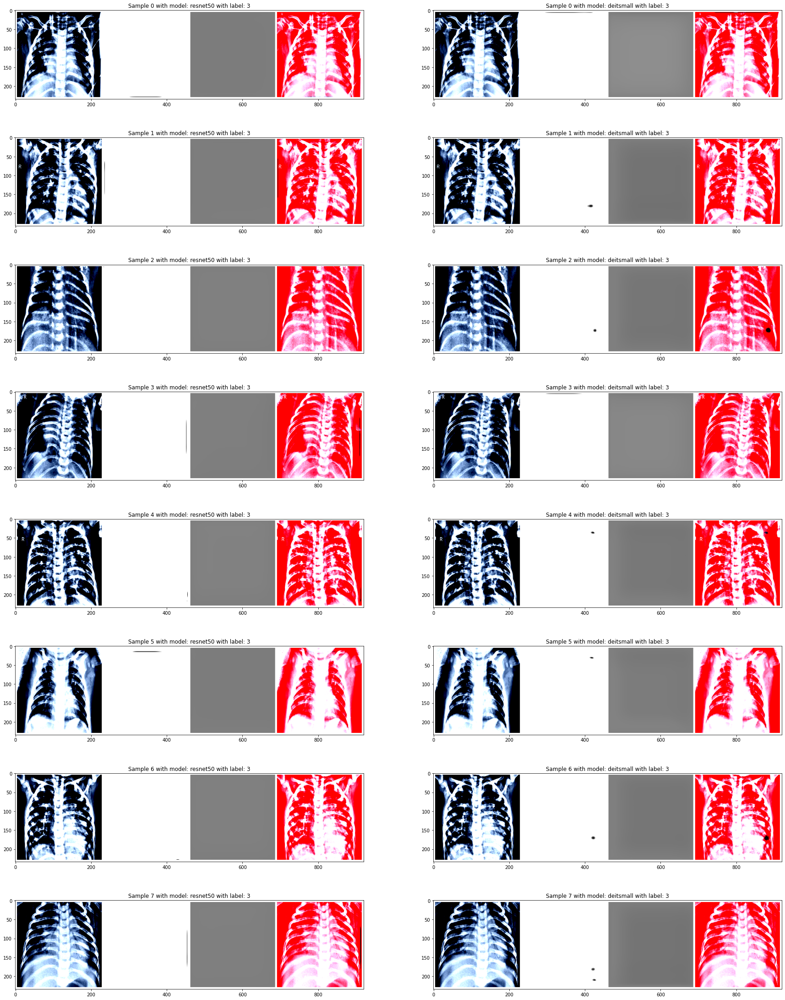

In [6]:
plt.rcParams['figure.figsize'] = [30, 40]
n_samples = 8
for i in range(n_samples):
    for j, model in enumerate(models):
        model_ = DecoderEncoderDecoderOriginal(num_classes, models[model]["arch"], hidden_size=64, dropout_rate=0.5, pretrained=True, decoder_mode="up")
        name = "best_model.pt"
        model_.load_state_dict(torch.load(f"{models[model]['path']}/{name}" , map_location=device))
        model_.to(device)
        model_.eval()

        plt.subplot(n_samples, 2, i*2 + j + 1)
        plt.title(f"Sample {i} with model: {model} with label: {label[i]}")
        sample_data = data[i]
        to_show = sample_data.unsqueeze(0)
        logits, logits_explanations, explanations, image_and_explanations = model_.forward(sample_data.unsqueeze(0).to(device))
        
        v_min, v_max = explanations.min(), explanations.max()
        new_min, new_max = 0, 255
        explanations = (explanations - v_min)/(v_max - v_min)*(new_max - new_min) + new_min
        explanations_ = torch.vstack((explanations.cpu(), torch.zeros_like(explanations.cpu()), torch.zeros_like(explanations.cpu()))).squeeze(1).unsqueeze(0)
        to_show = torch.cat((to_show, explanations.repeat(1, 3, 1, 1).cpu(), image_and_explanations.cpu(), to_show + explanations_), 0)
        
        
        save_image(to_show, 'tmp_tmp.png', pad_value=255, padding=5)
        plt.imshow(plt.imread('tmp_tmp.png'))
        os.remove('tmp_tmp.png')
        
plt.show()

# Iteration 1 just addition

In [7]:
models = {
    "resnet50": 
        {"arch": "ResNet50", "path":"results/iter1_ResNet50"},
    "deitsmall": 
        {"arch": "DeiTSmall", "path":"results/iter1_DeiTSmall"}
}

dataset_path = "./dataset/"
csv_path = "./csv_files/"
batch_size = 32
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = 'cuda' if torch.cuda.is_available() else 'cpu'
image_size = 224

train_loader, validation_loader, test_loader = get_dataloader(batch_size, dataset_path, csv_path, image_size=image_size, device=device)
num_classes = len(set(test_loader.dataset.target_classes))


## Getting Results

In [8]:
results = {model: {} for model in models}

for model in models:
    for name in ["best_model.pt"]:
        model_ = DecoderEncoderDecoder(num_classes, models[model]["arch"], hidden_size=64, dropout_rate=0.5, pretrained=True, decoder_mode="up")
        model_.load_state_dict(torch.load(f"{models[model]['path']}/{name}" , map_location=device))
        model_.to(device)
        model_.eval()
        report, report_expl = eval(model_, test_loader, device)
        results[model][name] = {"report": report, "report_expl": report_expl}

for t in ["resnet50", "deitsmall"]:
    for n in ["best_model.pt"]:
        for a in ["report", "report_expl"]:
            print("#"*100)
            print(t, n, a)
            print(results[t][n][a])
            print("#"*100)

Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main


####################################################################################################
resnet50 best_model.pt report
              precision    recall  f1-score   support

      Normal      0.962     0.970     0.966       370
    COVID-19      0.981     0.970     0.975       368
       Virus      0.852     0.870     0.861       285
    bacteria      0.868     0.853     0.860       278

    accuracy                          0.923      1301
   macro avg      0.916     0.916     0.916      1301
weighted avg      0.923     0.923     0.923      1301

####################################################################################################
####################################################################################################
resnet50 best_model.pt report_expl
              precision    recall  f1-score   support

      Normal      0.966     0.986     0.976       370
    COVID-19      0.986     0.986     0.986       368
       Virus      0.852     0.867 

### Visualize Explainations

In [9]:
data, label = next(iter(test_loader))

Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main


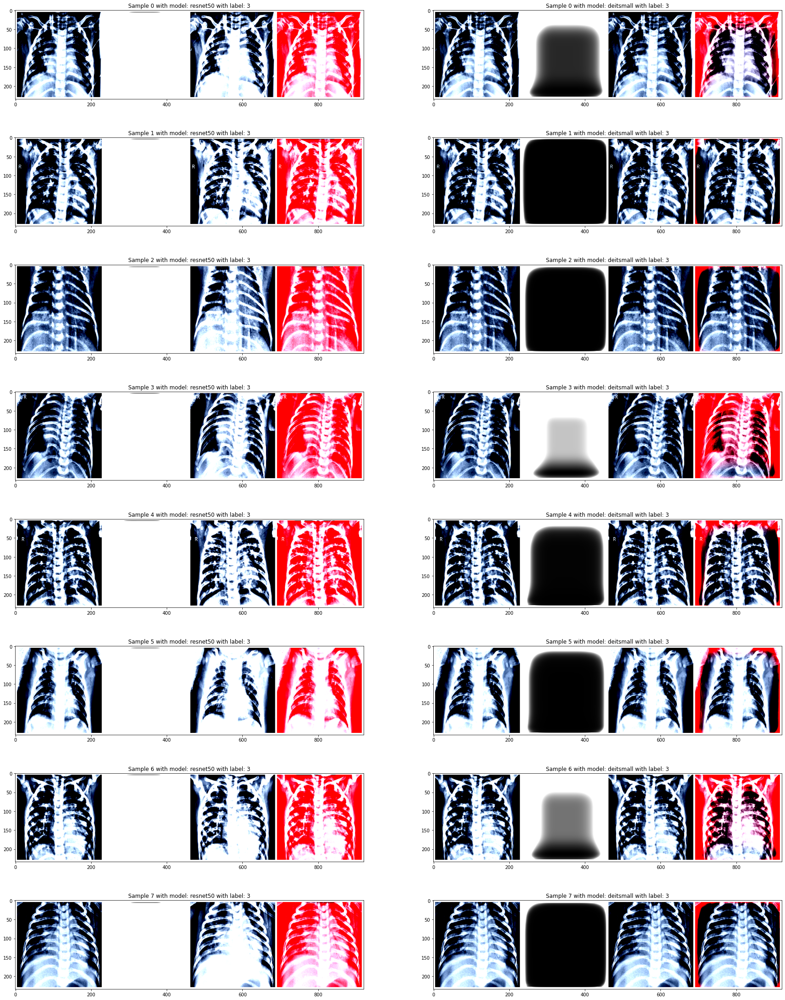

In [10]:
plt.rcParams['figure.figsize'] = [30, 40]
n_samples = 8
for i in range(n_samples):
    for j, model in enumerate(models):
        model_ = DecoderEncoderDecoder(num_classes, models[model]["arch"], hidden_size=64, dropout_rate=0.5, pretrained=True, decoder_mode="up")
        name = "best_model.pt"
        model_.load_state_dict(torch.load(f"{models[model]['path']}/{name}" , map_location=device))
        model_.to(device)
        model_.eval()

        plt.subplot(n_samples, 2, i*2 + j + 1)
        plt.title(f"Sample {i} with model: {model} with label: {label[i]}")
        sample_data = data[i]
        to_show = sample_data.unsqueeze(0)
        logits, logits_explanations, explanations, image_and_explanations = model_.forward(sample_data.unsqueeze(0).to(device))
        v_min, v_max = explanations.min(), explanations.max()
        new_min, new_max = 0, 255
        explanations = (explanations - v_min)/(v_max - v_min)*(new_max - new_min) + new_min
        explanations_ = torch.vstack((explanations.cpu(), torch.zeros_like(explanations.cpu()), torch.zeros_like(explanations.cpu()))).squeeze(1).unsqueeze(0)
        to_show = torch.cat((to_show, explanations.repeat(1, 3, 1, 1).cpu(), image_and_explanations.cpu(), to_show + explanations_), 0)
        
        save_image(to_show, 'tmp_tmp.png', pad_value=255, padding=5)
        plt.imshow(plt.imread('tmp_tmp.png'))
        os.remove('tmp_tmp.png')
plt.show()

# Iteration 2

In [21]:
models = {
    "resnet50": 
        {"arch": "ResNet50", "path":"results/iter2_ResNet50"},
    "deitsmall": 
        {"arch": "DeiTSmall", "path":"results/iter2_DeiTSmall"}
}

dataset_path = "./dataset/"
csv_path = "./csv_files/"
batch_size = 32
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = 'cuda' if torch.cuda.is_available() else 'cpu'
image_size = 224

results = {model: {} for model in models}

train_loader, validation_loader, test_loader = get_dataloader(batch_size, dataset_path, csv_path, image_size=image_size, device=device)
num_classes = len(set(test_loader.dataset.target_classes))


results = {model: {} for model in models}

for model in models:
    for name in ["best_model.pt"]:
        model_ = DecoderEncoderDecoder(num_classes, models[model]["arch"], hidden_size=64, dropout_rate=0.5, pretrained=True, decoder_mode="up")
        model_.load_state_dict(torch.load(f"{models[model]['path']}/{name}" , map_location=device))
        model_.to(device)
        model_.eval()
        report, report_expl = eval(model_, test_loader, device)
        results[model][name] = {"report": report, "report_expl": report_expl}

for t in ["resnet50", "deitsmall"]:
    for n in ["best_model.pt"]:
        for a in ["report", "report_expl"]:
            print("#"*30)
            print(t, n, a)
            print(results[t][n][a])
            print("#"*30)

Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main


##############################
resnet50 best_model.pt report
              precision    recall  f1-score   support

      Normal      0.973     0.976     0.974       370
    COVID-19      0.984     0.981     0.982       368
       Virus      0.858     0.909     0.882       285
    bacteria      0.900     0.845     0.872       278

    accuracy                          0.935      1301
   macro avg      0.929     0.928     0.928      1301
weighted avg      0.935     0.935     0.935      1301

##############################
##############################
resnet50 best_model.pt report_expl
              precision    recall  f1-score   support

      Normal      0.960     0.976     0.968       370
    COVID-19      0.973     0.978     0.976       368
       Virus      0.892     0.842     0.866       285
    bacteria      0.853     0.878     0.865       278

    accuracy                          0.926      1301
   macro avg      0.920     0.918     0.919      1301
weighted avg      0.926    

Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main


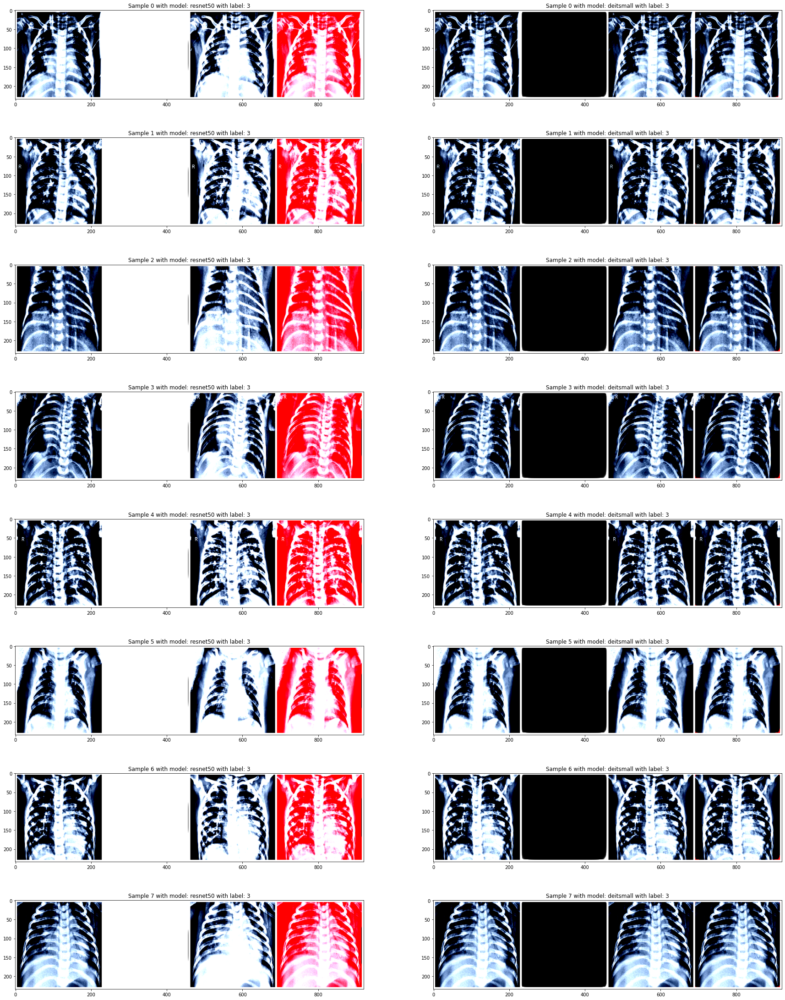

In [20]:
data, label = next(iter(test_loader))

plt.rcParams['figure.figsize'] = [30, 40]
n_samples = 8
for i in range(n_samples):
    for j, model in enumerate(models):
        model_ = DecoderEncoderDecoder(num_classes, models[model]["arch"], hidden_size=64, dropout_rate=0.5, pretrained=True, decoder_mode="up")
        name = "best_model.pt"
        model_.load_state_dict(torch.load(f"{models[model]['path']}/{name}" , map_location=device))
        model_.to(device)
        model_.eval()

        plt.subplot(n_samples, 2, i*2 + j + 1)
        plt.title(f"Sample {i} with model: {model} with label: {label[i]}")
        sample_data = data[i]
        to_show = sample_data.unsqueeze(0)
        logits, logits_explanations, explanations, image_and_explanations = model_.forward(sample_data.unsqueeze(0).to(device))
        
        v_min, v_max = explanations.min(), explanations.max()
        new_min, new_max = 0, 255
        explanations = (explanations - v_min)/(v_max - v_min)*(new_max - new_min) + new_min
        explanations_ = torch.vstack((explanations.cpu(), torch.zeros_like(explanations.cpu()), torch.zeros_like(explanations.cpu()))).squeeze(1).unsqueeze(0)
        to_show = torch.cat((to_show, explanations.repeat(1, 3, 1, 1).cpu(), image_and_explanations.cpu(), to_show + explanations_), 0)
        
        save_image(to_show, 'tmp_tmp.png', pad_value=255, padding=5)
        plt.imshow(plt.imread('tmp_tmp.png'))
        os.remove('tmp_tmp.png')
plt.show()


# Iteration 3

In [13]:
models = {
    "resnet50": 
        {"arch": "ResNet50", "path":"results/iter3_ResNet50"},
    "deitsmall": 
        {"arch": "DeiTSmall", "path":"results/iter3_DeiTSmall"}
}

dataset_path = "segmentation/segmented_dataset"
csv_path = "./csv_files/"
batch_size = 32
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = 'cuda' if torch.cuda.is_available() else 'cpu'
image_size = 224

results = {model: {} for model in models}

train_loader, validation_loader, test_loader = get_dataloader(batch_size, dataset_path, csv_path, image_size=image_size, device=device)
num_classes = len(set(test_loader.dataset.target_classes))


for model in models:
    for name in ["best_model.pt"]:
        model_ = DecoderEncoderDecoder(num_classes, models[model]["arch"], hidden_size=64, dropout_rate=0.5, pretrained=True, decoder_mode="up")
        model_.load_state_dict(torch.load(f"{models[model]['path']}/{name}" , map_location=device))
        model_.to(device)
        model_.eval()
        report, report_expl = eval(model_, test_loader, device)
        results[model][name] = {"report": report, "report_expl": report_expl}

for t in ["resnet50", "deitsmall"]:
    for n in ["best_model.pt"]:
        for a in ["report", "report_expl"]:
            print("#"*100)
            print(t, n, a)
            print(results[t][n][a])
            print("#"*100)

Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main


####################################################################################################
resnet50 best_model.pt report
              precision    recall  f1-score   support

      Normal      0.918     0.873     0.895       370
    COVID-19      0.862     0.951     0.904       368
       Virus      0.792     0.761     0.776       285
    bacteria      0.792     0.766     0.779       278

    accuracy                          0.848      1301
   macro avg      0.841     0.838     0.839      1301
weighted avg      0.847     0.848     0.847      1301

####################################################################################################
####################################################################################################
resnet50 best_model.pt report_expl
              precision    recall  f1-score   support

      Normal      0.897     0.897     0.897       370
    COVID-19      0.889     0.935     0.911       368
       Virus      0.798     0.761 

In [14]:
     
data, label = next(iter(test_loader))


Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main


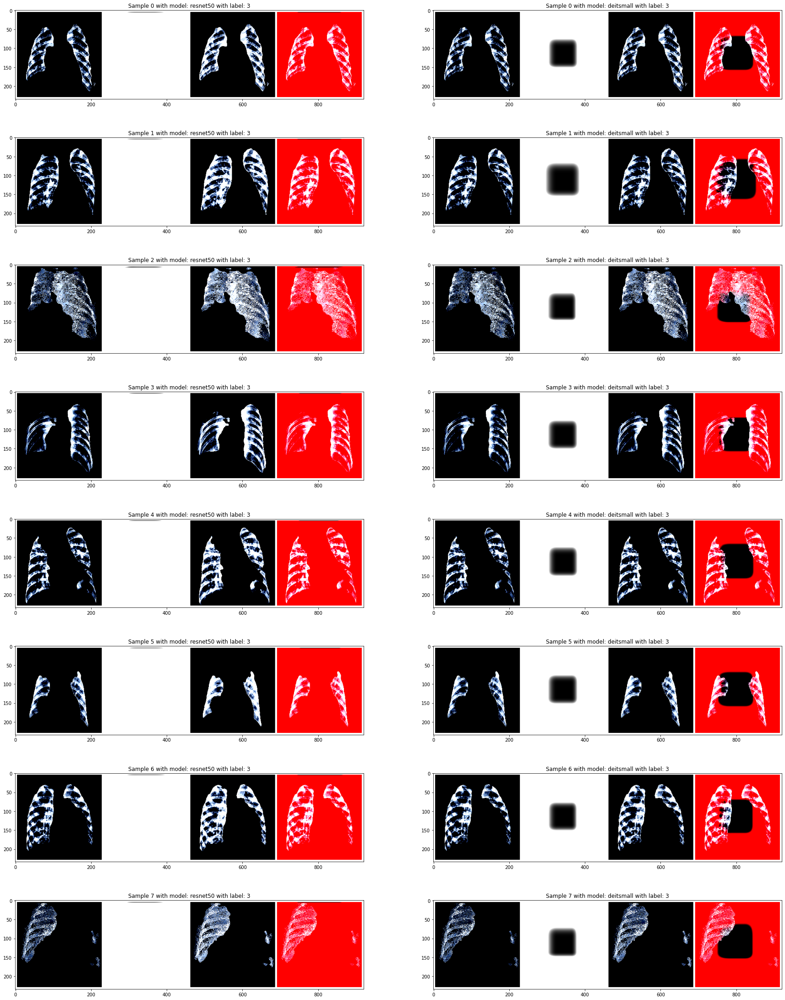

In [15]:

plt.rcParams['figure.figsize'] = [30, 40]
n_samples = 8
for i in range(n_samples):
    for j, model in enumerate(models):
        model_ = DecoderEncoderDecoder(num_classes, models[model]["arch"], hidden_size=64, dropout_rate=0.5, pretrained=True, decoder_mode="up")
        name = "best_model.pt"
        model_.load_state_dict(torch.load(f"{models[model]['path']}/{name}" , map_location=device))
        model_.to(device)
        model_.eval()

        plt.subplot(n_samples, 2, i*2 + j + 1)
        plt.title(f"Sample {i} with model: {model} with label: {label[i]}")
        sample_data = data[i]
        to_show = sample_data.unsqueeze(0)
        logits, logits_explanations, explanations, image_and_explanations = model_.forward(sample_data.unsqueeze(0).to(device))
        
        v_min, v_max = explanations.min(), explanations.max()
        new_min, new_max = 0, 255
        explanations = (explanations - v_min)/(v_max - v_min)*(new_max - new_min) + new_min
        explanations_ = torch.vstack((explanations.cpu(), torch.zeros_like(explanations.cpu()), torch.zeros_like(explanations.cpu()))).squeeze(1).unsqueeze(0)
        to_show = torch.cat((to_show, explanations.repeat(1, 3, 1, 1).cpu(), image_and_explanations.cpu(), to_show + explanations_), 0)
        
        save_image(to_show, 'tmp_tmp.png', pad_value=255, padding=5)
        plt.imshow(plt.imread('tmp_tmp.png'))
        os.remove('tmp_tmp.png')
plt.show()

# Iteration 4

In [16]:
import copy

models = {
    "resnet50": 
        {"arch": "ResNet50", "path":"results/iter4_ResNet50"},
    "deitsmall": 
        {"arch": "DeiTSmall", "path":"results/iter4_DeiTSmall"}
}

dataset_path = "./dataset/"
csv_path = "./csv_files/"
batch_size = 32
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = 'cuda' if torch.cuda.is_available() else 'cpu'
image_size = 224

results = {model: {} for model in models}

train_loader, validation_loader, test_loader = get_dataloader(batch_size, dataset_path, csv_path, image_size=image_size, device=device)
num_classes = len(set(test_loader.dataset.target_classes))


for model in models:
    for name in ["best_model.pt"]:
        model_ = DecoderEncoderDecoderv2(num_classes, models[model]["arch"], hidden_size=64, dropout_rate=0.5, pretrained=True, decoder_mode="up")
        model_.load_state_dict(torch.load(f"{models[model]['path']}/{name}" , map_location=device))
        model_.to(device)
        model_.eval()
        report, report_expl = eval_last(model_, test_loader, device)
        results[model][name] = {"report": report, "report_expl": report_expl}

for t in ["resnet50", "deitsmall"]:
    for n in ["best_model.pt"]:
        for a in ["report", "report_expl"]:
            print("#"*100)
            print(t, n, a)
            print(results[t][n][a])
            print("#"*100)

Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main


####################################################################################################
resnet50 best_model.pt report
              precision    recall  f1-score   support

      Normal      0.973     0.968     0.970       370
    COVID-19      0.971     0.984     0.977       368
       Virus      0.871     0.902     0.886       285
    bacteria      0.898     0.856     0.877       278

    accuracy                          0.934      1301
   macro avg      0.928     0.927     0.928      1301
weighted avg      0.934     0.934     0.934      1301

####################################################################################################
####################################################################################################
resnet50 best_model.pt report_expl
              precision    recall  f1-score   support

      Normal      0.965     0.981     0.973       370
    COVID-19      0.981     0.976     0.978       368
       Virus      0.845     0.902 

In [17]:
data, label = next(iter(test_loader))

Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /home/xai/.cache/torch/hub/facebookresearch_deit_main
Using cache found in /hom

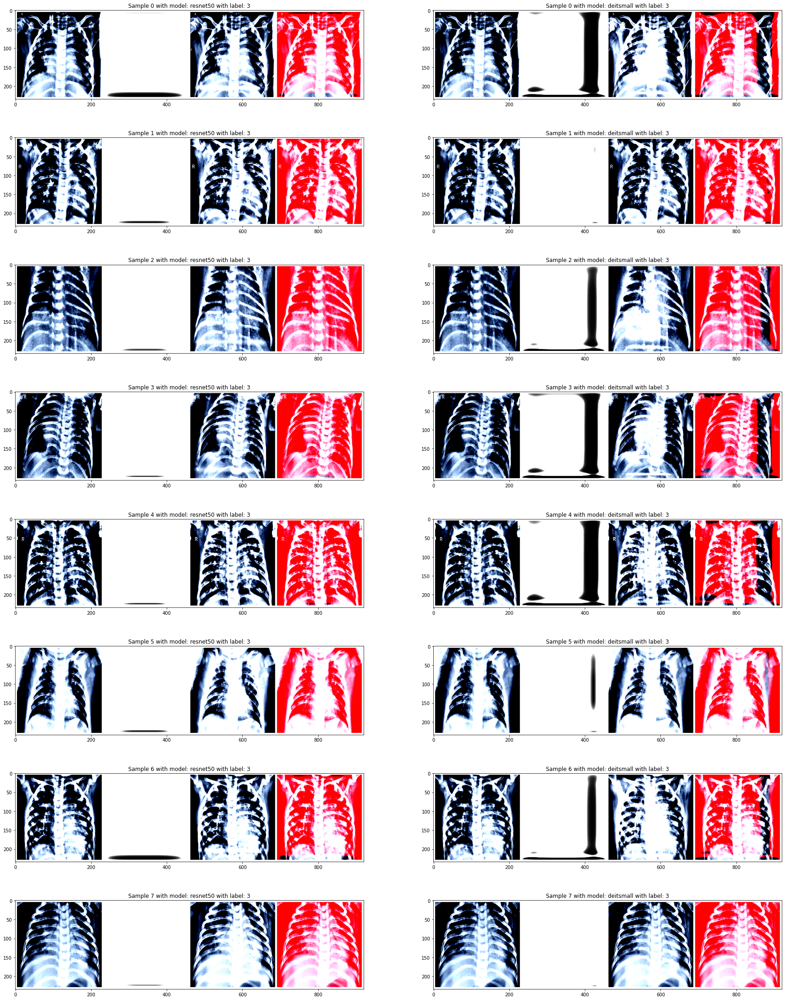

In [18]:

plt.rcParams['figure.figsize'] = [30, 40]
n_samples = 8
for i in range(n_samples):
    for j, model in enumerate(models):
        model_ = DecoderEncoderDecoderv2(num_classes, models[model]["arch"], hidden_size=64, dropout_rate=0.5, pretrained=True, decoder_mode="up")
        name = "best_model.pt"
        model_.load_state_dict(torch.load(f"{models[model]['path']}/{name}" , map_location=device))
        model_.to(device)
        model_.eval()

        plt.subplot(n_samples, 2, i*2 + j + 1)
        plt.title(f"Sample {i} with model: {model} with label: {label[i]}")
        sample_data = data[i]
        to_show = sample_data.unsqueeze(0)
        logits, logits_explanations, explanations, image_and_explanations = model_.forward(sample_data.unsqueeze(0).to(device), 500)
        
        v_min, v_max = explanations.min(), explanations.max()
        new_min, new_max = 0, 255
        explanations = (explanations - v_min)/(v_max - v_min)*(new_max - new_min) + new_min
        explanations_ = torch.vstack((explanations.cpu(), torch.zeros_like(explanations.cpu()), torch.zeros_like(explanations.cpu()))).squeeze(1).unsqueeze(0)
        to_show = torch.cat((to_show, explanations.repeat(1, 3, 1, 1).cpu(), image_and_explanations.cpu(), to_show + explanations_), 0)
        
        save_image(to_show, 'tmp_tmp.png', pad_value=255, padding=5)
        plt.imshow(plt.imread('tmp_tmp.png'))
        os.remove('tmp_tmp.png')
plt.show()